In [2]:
import importlib
import cloudsat_preprocess
import himawari_plotting
import numpy as np
import matplotlib.pyplot as plt
from function_tool import cal_qvs
import netCDF4 as nc
from scipy import interpolate

In [3]:
lat = [-10, 60]
lon = [90, 150]

In [4]:
data_path = '/data/C.jerryjerry9/hima_download/himawari_data'
hima_plot = himawari_plotting.Himawari(work_path=[],data_path=data_path,plotting_lat_range=lat,plotting_lon_range=lon)

In [7]:
cloudsat = cloudsat_preprocess.CloudSat(work_path=[],lat_range=lat,lon_range=lon)

In [8]:
cloudsat.product_list()

CloudSat 2B product list on 107
hdf-GEOPROF; hdf-GEOPROF-LIDAR; hdf-FLXHR-LIDAR


In [9]:
#product_name = 'hdf-GEOPROF', 'hdf-GEOPROF-LIDAR'
geoprof_file = ['/data/dadm1/obs/CloudSat/hdf-GEOPROF/2016/2016359034029_56694_CS_2B-GEOPROF_GRANULE_P1_R05_E06_F01.hdf']
geoprof_lid_file = ['/data/dadm1/obs/CloudSat/hdf-GEOPROF-LIDAR/2016/2016359034029_56694_CS_2B-GEOPROF-LIDAR_GRANULE_P2_R05_E06_F01.hdf']

In [10]:
Vdata_name,Vdata_len,SD_name = cloudsat.hdf_information(geoprof_file)

In [11]:
for i in range(0,5):
    print(Vdata_name[i],Vdata_len[i])

Profile_time 37082
UTC_start 1
TAI_start 1
Latitude 37082
Longitude 37082


In [12]:
SD_name

['CPR_Cloud_mask', 'Gaseous_Attenuation', 'Height', 'Radar_Reflectivity']

In [13]:
factor, missing_value = cloudsat.cloudsat_var_attribute('Radar_Reflectivity')
print(factor, missing_value)

[100] [-88.88]


In [19]:
### read ori data
ori_lon_list = cloudsat.read_ori_vdata(extracted_geo,'Longitude')
ori_ref_list = cloudsat.read_ori_sddata(extracted_geo,'Radar_Reflectivity')
### read ori data

read variable: ['Longitude']
read variable: ['Radar_Reflectivity']


In [20]:
print(np.array(ori_lon_list[0]).shape)
print(np.array(ori_ref_list[0]).shape)

(37082, 1)
(37082, 125)


In [15]:
rgb_file = ['himawari_data/composite_data/201612240430_true_color_2km_rgb.nc']
rgb_array,plotting_lon_list,plotting_lat_list,output_file_list  = hima_plot.read_rgb_nc_file(rgb_file)

read file:himawari_data/composite_data/201612240430_true_color_2km_rgb.nc


read variable: ['Longitude']
read variable: ['Latitude']
read variable: ['Data_quality']
Check CloudSat track pass the traget domain
read variable: ['Profile_time']
read variable: ['UTC_start']
read variable: ['Longitude']
read variable: ['Latitude']


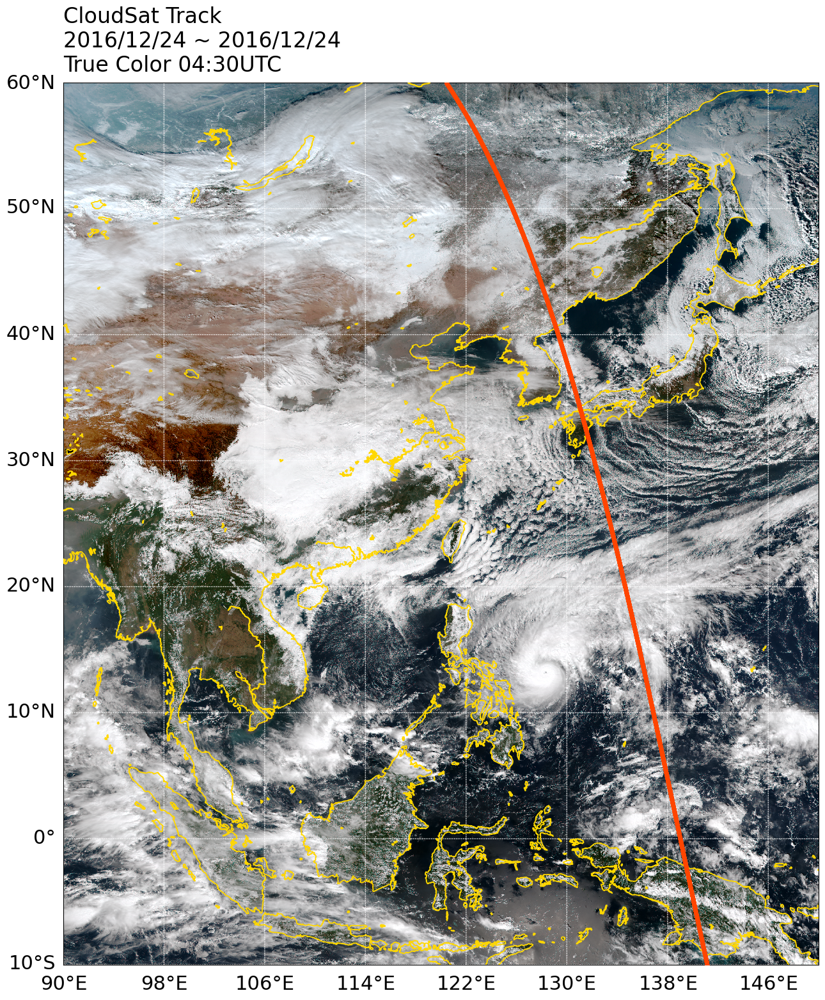

In [16]:
cloudsat.plot_track_w_rgb(geoprof_file[0],rgb_array[0],plotting_lon_list,plotting_lat_list,
                          coast_line_color='gold',
                          lonlat_c='w',lonlat_width=1,lonlat_order=2,lonlat_step=8,font_size=24,
                          figure_title='CloudSat Track',rgb_product='True Color',rgb_time='04:30UTC',
                          prefix='cloudsat_track_w_truecolor',
                          dpi=300, figure_path='cloudsat_fig',save_fig=True)

In [17]:
target_lon_range = [90, 150]
target_lat_range = [15, 30]

In [18]:
#product_name = 'hdf-GEOPROF', 'hdf-GEOPROF-LIDAR'
extracted_geo,extracted_mask_geo = cloudsat.sub_domain_check(geoprof_file,target_lon_range,target_lat_range,mask_output=True)
extracted_lid,extracted_mask_lid = cloudsat.sub_domain_check(geoprof_lid_file,target_lon_range,target_lat_range,mask_output=True)

read variable: ['Longitude']
read variable: ['Latitude']
read variable: ['Data_quality']
Check CloudSat track pass the traget domain
read variable: ['Longitude']
read variable: ['Latitude']
read variable: ['Data_quality']
Check CloudSat track pass the traget domain


In [21]:
extracted_lon = cloudsat.read_vdata(extracted_geo,'Longitude',extracted_mask_geo,fit_era5_lon=True)
extracted_lat = cloudsat.read_vdata(extracted_geo,'Latitude',extracted_mask_geo)

read variable: ['Longitude']
read variable: ['Latitude']


In [22]:
extracted_ref = cloudsat.read_sddata(extracted_geo,'Radar_Reflectivity',extracted_mask_geo)

read variable: ['Radar_Reflectivity']


In [23]:
extracted_CPR_cldmask = cloudsat.read_sddata(extracted_geo,'CPR_Cloud_mask',extracted_mask_geo)

read variable: ['CPR_Cloud_mask']


In [24]:
extracted_height = cloudsat.read_sddata(extracted_geo,'Height',extracted_mask_geo)

read variable: ['Height']


In [25]:
extracted_cfraction = cloudsat.read_sddata(extracted_lid,'CloudFraction',extracted_mask_lid)

read variable: ['CloudFraction']


In [26]:
extracted_uncf = cloudsat.read_sddata(extracted_lid,'UncertaintyCF',extracted_mask_lid)

read variable: ['UncertaintyCF']


In [27]:
extracted_cfraction[0][extracted_uncf[0]<=0] = np.nan
extracted_ref[0][extracted_ref[0]==-88.88] = np.nan
extracted_ref[0][extracted_CPR_cldmask[0]<19.5] = np.nan

In [28]:
extracted_hdf_date,extracted_hdf_id,extracted_hdf_granule, \
extracted_region_start_time,extracted_region_end_time \
= cloudsat.read_geometric_info(extracted_geo, extracted_mask_geo)

read variable: ['Profile_time']
read variable: ['UTC_start']


In [61]:
importlib.reload(cloudsat_preprocess)
cloudsat = cloudsat_preprocess.CloudSat(work_path=[],lat_range=lat,lon_range=lon)

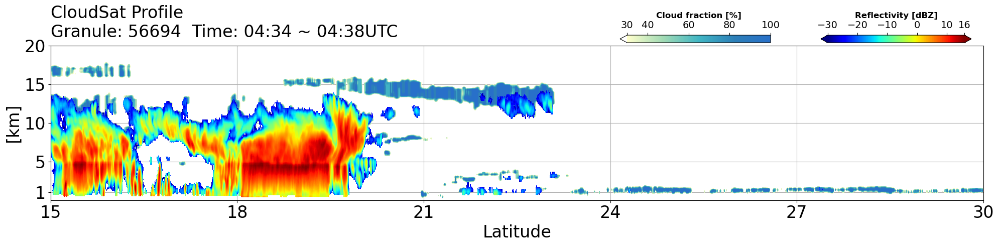

In [62]:
cloudsat.plot_profile(extracted_ref,extracted_cfraction,'contourf',
                      extracted_lat,5,extracted_height,[0,20],5,
                      5,
                      extracted_hdf_date,extracted_hdf_granule,
                      extracted_region_start_time,extracted_region_end_time,
                      figure_title='CloudSat Profile',
                      prefix='cldsat_prof',figure_path='cloudsat_fig',dpi=300,save_fig=True)

read variable: ['Longitude']
read variable: ['Latitude']
read variable: ['Data_quality']
Check CloudSat track pass the traget domain
read variable: ['Profile_time']
read variable: ['UTC_start']
read variable: ['Longitude']
read variable: ['Latitude']


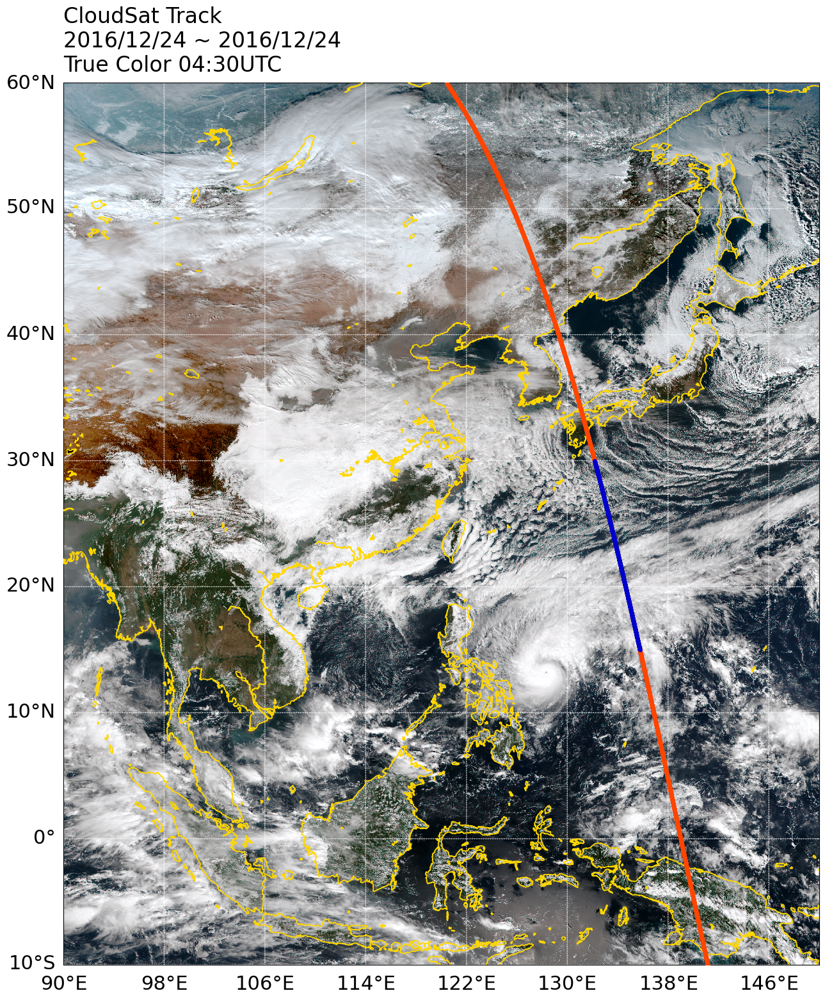

In [32]:
cloudsat.plot_track_w_rgb(geoprof_file[0],rgb_array[0],plotting_lon_list,plotting_lat_list,
                          extracted_lon,extracted_lat, 
                          extracted_hdf_date,extracted_hdf_id,extracted_hdf_granule, 
                          extracted_region_start_time,extracted_region_end_time,
                          extracted_time=False,coast_line_color='gold',
                          lonlat_c='w',lonlat_width=1,lonlat_order=2,lonlat_step=8,font_size=24,
                          figure_title='CloudSat Track',rgb_product='True Color',rgb_time='04:30UTC',
                          prefix='cloudsat_track_w_truecolor',
                          dpi=300, figure_path='cloudsat_fig',save_fig=False)

In [33]:
era5_x = np.arange(0,359.8,0.25)
era5_y = np.arange(90,-90.001,-0.25)
event_lat = extracted_lat[0]
event_lon = extracted_lon[0]

In [34]:
## prepare collocate data mask 
latlon_mask = np.zeros((event_lat.shape[0],2))
y_mask = abs((event_lat-90.125)/0.25)
x_mask = (event_lon+0.125)/0.25
latlon_mask[:,0] = np.ceil(y_mask)-1 ## lat
latlon_mask[:,1] = np.floor(x_mask)  ## lon
## extract sub-domian era5 data
lat_min = int(np.min(latlon_mask[:,0]))
lat_max = int(np.max(latlon_mask[:,0]))
lon_min = int(np.min(latlon_mask[:,1]))
lon_max = int(np.max(latlon_mask[:,1]))
## fit sub-domain era5data
latlon_mask[:,0] = latlon_mask[:,0] - lat_min
latlon_mask[:,1] = latlon_mask[:,1] - lon_min

In [47]:
#201612240430
## read era5 data 
era5_file = '/data/dadm1/reanalysis/ERA5/PRS/day/q/2016/ERA5_PRS_q_201612_r1440x721_day.nc'
ec_re = nc.Dataset(era5_file, 'r',  format='NETCDF4_CLASSIC')
pressure = np.array(ec_re.variables['level'])
q = np.array(ec_re.variables['q'][23,:,lat_min:lat_max+1,lon_min:lon_max+1])
rh_pre = np.zeros((pressure.shape[0],1,1))
rh_pre[:,0,0] = pressure[:,]
era5_lat = np.array(ec_re.variables['latitude'])[lat_min:lat_max+1]
###
era5_file = '/data/dadm1/reanalysis/ERA5/PRS/day/t/2016/ERA5_PRS_t_201612_r1440x721_day.nc'
ec_re = nc.Dataset(era5_file, 'r',  format='NETCDF4_CLASSIC')
t = np.array(ec_re.variables['t'][23,:,lat_min:lat_max+1,lon_min:lon_max+1])
### 
era5_file = '/data/dadm1/reanalysis/ERA5/PRS/day/z/2016/ERA5_PRS_z_201612_r1440x721_day.nc'
ec_re = nc.Dataset(era5_file, 'r',  format='NETCDF4_CLASSIC')
z = np.array(ec_re.variables['z'][23,:,lat_min:lat_max+1,lon_min:lon_max+1])/9.8
### calculate RH
rh  = q/cal_qvs(t, rh_pre)*100

In [36]:
event_height = extracted_height[0]
event_height[event_height ==-9999] = np.nan

In [ ]:
###
# regrid to cloudsat array
###

In [55]:
cloudsat_rh = np.empty((event_lat.shape[0],125))
for i in range(0,event_lat.shape[0]):
    f = interpolate.interp1d(z[:,int(latlon_mask[i,0]),int(latlon_mask[i,1])], rh[:,int(latlon_mask[i,0]),int(latlon_mask[i,1])],fill_value='extrapolate')

    cloudsat_rh[i,:] = f(event_height[i,:])

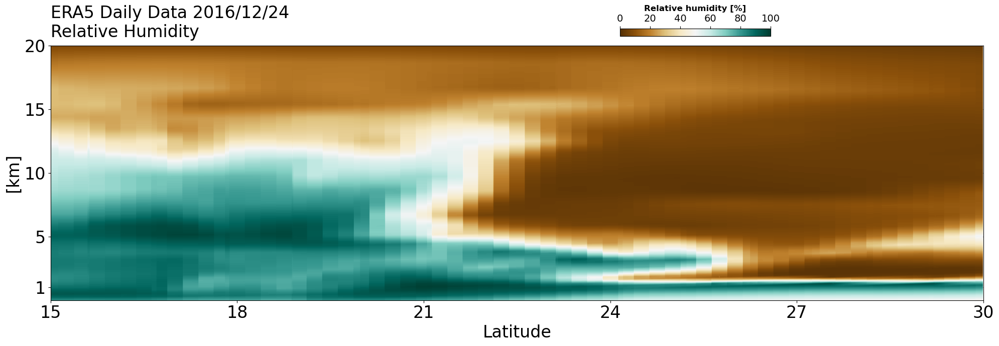

In [57]:
x_s = np.around(event_lat[0],decimals=1)
x_e = np.around(event_lat[-1],decimals=1)
x_range = sorted([x_s,x_e])
x_step=5
x_interval = np.floor((x_range[1] - x_range[0])/(x_step-1))
if x_step <1:
    x_step = 1

fig,ax1 = plt.subplots(1,1,figsize=(20,7),tight_layout=True)
x_axis = np.tile(event_lat.reshape(event_lat.shape[0],1),(1,125))
y_axis = event_height/1000

plot_rh  = plt.contourf(x_axis,y_axis,cloudsat_rh,cmap='BrBG',levels=np.arange(0,100.05,0.1),zorder=2)
plt.xticks(np.arange(x_range[0],x_range[1]+1,x_interval),fontsize=24)
height_range = [0,20]
height_step = 5
hei_jump = int(np.floor((height_range[1] - height_range[0])/(height_step-1)))
if hei_jump == 0:
    hei_jump = 1
hei_range = list(np.arange(height_range[0],height_range[1]+1,hei_jump))
hei_ticks = [1]
hei_ticks.extend(hei_range[1:])

plt.yticks(hei_ticks,fontsize=24)

plt.axis([x_range[0],x_range[1],
        height_range[0], height_range[1]])
plt.xlabel('Latitude',fontsize=24)
plt.ylabel('[km]',fontsize=24)
plt.grid(zorder=1)
title = 'ERA5 Daily Data 2016/12/24\nRelative Humidity'
cloudsat.plot_title_unit(title,loc='left',pad=12,font_size=24)

cbar_ax = fig.add_axes([0.62, 0.89, 0.15, 0.022])
c_plot_rh = plt.colorbar(plot_rh,ticks=[0,20,40,60,80,100],cax=cbar_ax,orientation='horizontal',
                    location='top',pad=0.06,fraction=0.05,aspect=16,anchor=(0.95,1.0))
c_plot_rh.ax.tick_params(labelsize=14)
c_plot_rh.set_label(label='Relative humidity [%]', size=12, weight='bold')
cloudsat.save_fig_unit('20161224',prefix='ERA5_rh',
                       dpi=300, figure_path='cloudsat_fig',save_fig=True)

In [58]:
###
# extract era5 data on cloudsat cross section
###

In [66]:
cloudsat_rh = np.empty((75,37))
cloudsat_lat = np.empty((75))
array_len = 1 
cloudsat_rh[array_len- 1] = rh[:,int(latlon_mask[0,0]),int(latlon_mask[0,1])]
cloudsat_lat[array_len-1] = era5_lat[int(latlon_mask[0,0])]
for i in range(1,event_lat.shape[0]):
    lat_diff = int(latlon_mask[i,0]) - int(latlon_mask[i-1,0])
    lon_diff = int(latlon_mask[i,1]) - int(latlon_mask[i-1,1])
    if lat_diff!=0  or lon_diff!=0:
        array_len = array_len +1

In [69]:
cloudsat_rh = np.empty((array_len,37))
cloudsat_lat = np.empty((array_len))
array_pos = 1 
cloudsat_rh[array_pos - 1] = rh[:,int(latlon_mask[0,0]),int(latlon_mask[0,1])]
cloudsat_lat[array_pos - 1] = era5_lat[int(latlon_mask[0,0])]
for i in range(1,event_lat.shape[0]):
    lat_diff = int(latlon_mask[i,0]) - int(latlon_mask[i-1,0])
    lon_diff = int(latlon_mask[i,1]) - int(latlon_mask[i-1,1])
    if lat_diff!=0  or lon_diff!=0:
        array_pos = array_pos + 1
        cloudsat_rh[array_pos-1] = rh[:,int(latlon_mask[i,0]),int(latlon_mask[i,1])]
        cloudsat_lat[array_pos-1] = era5_lat[int(latlon_mask[i,0])]

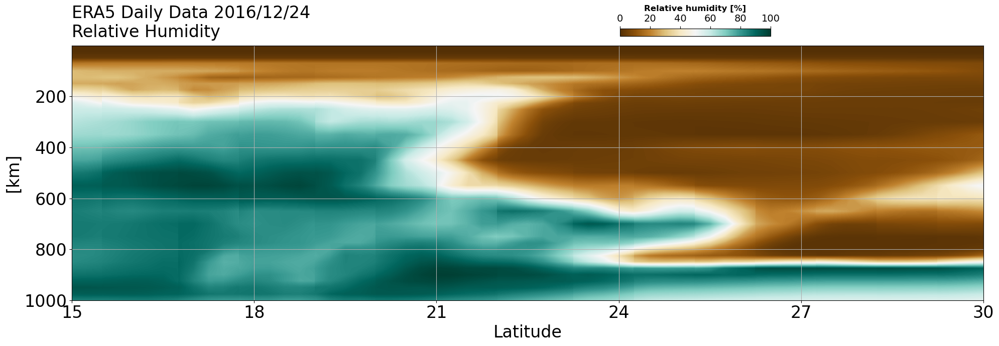

In [70]:
x_s = np.around(event_lat[0],decimals=1)
x_e = np.around(event_lat[-1],decimals=1)
x_range = sorted([x_s,x_e])
x_step=5
x_interval = np.floor((x_range[1] - x_range[0])/(x_step-1))
if x_step <1:
    x_step = 1

fig,ax1 = plt.subplots(1,1,figsize=(20,7),tight_layout=True)
y_axis = rh_pre[:,0,0]

plot_rh = plt.contourf(cloudsat_lat,y_axis,cloudsat_rh.T,cmap='BrBG',levels=np.arange(0,100.05,0.1))
#plot_rh = plt.pcolormesh(cloudsat_lat,y_axis,cloudsat_rh.T,cmap='BrBG',vmin=0,vmax=100)

plt.xticks(np.arange(x_range[0],x_range[1]+1,x_interval),fontsize=24)
height_range = [1000,0]
height_step = 6
hei_jump = int(np.floor((height_range[1] - height_range[0])/(height_step-1)))
if hei_jump == 0:
    hei_jump = 1
hei_range = list(np.arange(height_range[0],height_range[1]+1,hei_jump))
hei_ticks = hei_range[:]
plt.yticks(hei_ticks,fontsize=24)

plt.axis([x_range[0],x_range[1],
        height_range[0], height_range[1]])
plt.xlabel('Latitude',fontsize=24)
plt.ylabel('[km]',fontsize=24)
plt.grid(zorder=1)
title = 'ERA5 Daily Data 2016/12/24\nRelative Humidity'
cloudsat.plot_title_unit(title,loc='left',pad=12,font_size=24)

cbar_ax = fig.add_axes([0.62, 0.89, 0.15, 0.022])
c_plot_rh = plt.colorbar(plot_rh,ticks=[0,20,40,60,80,100],cax=cbar_ax,orientation='horizontal',
                    location='top',pad=0.06,fraction=0.05,aspect=16,anchor=(0.95,1.0))
c_plot_rh.ax.tick_params(labelsize=14)
c_plot_rh.set_label(label='Relative humidity [%]', size=12, weight='bold')
cloudsat.save_fig_unit('20161224',prefix='ERA5_rh',
                       dpi=300, figure_path='cloudsat_fig',save_fig=True)